![https://github.com/xarray-contrib/xvec/raw/main/doc/source/_static/logo.svg](https://github.com/xarray-contrib/xvec/raw/main/doc/source/_static/logo.svg)

# Vector data cubes as a bridge between raster and vector worlds

Martin Fleischmann
(@martinfleis)

A raster data cube, typically represented by an `xarray.DataArray`, is indexed either by `x` or `y` dimensions or `latitude` and `longitude`

A vector data cube is an n-D array with at least one dimension indexed by a 2-D array of vector geometries

## 0.1.0

In [1]:
import datetime

import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import xvec  # <- this

from geodatasets import get_path
import shapely
from shapely import Point, box

## The simplest DataArray

An array of values indexed by an array of geometries.

In [2]:
counties = gpd.read_file(get_path("geoda.natregimes"))

In [3]:
counties.head()

,REGIONS,NOSOUTH,POLY_ID,NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,FIPS,STFIPS,COFIPS,...,GI59,GI69,GI79,GI89,FH60,FH70,FH80,FH90,West,geometry
0,1.0,1.0,1,Lake of the Woods,Minnesota,27,077,27077,27,77,...,0.285235,0.372336,0.342104,0.336455,11.279621,5.4,5.663881,9.515860,0,"POLYGON ((-95.34258 48.54670, -95.34081 48.715..."
1,2.0,1.0,2,Ferry,Washington,53,019,53019,53,19,...,0.256158,0.360665,0.361928,0.360640,10.053476,2.6,10.079576,11.397059,1,"POLYGON ((-118.85050 47.94969, -118.84732 48.4..."
2,2.0,1.0,3,Stevens,Washington,53,065,53065,53,65,...,0.283999,0.394083,0.357566,0.369942,9.258437,5.6,6.812127,10.352015,1,"POLYGON ((-117.43777 48.04422, -117.54113 48.0..."
3,2.0,1.0,4,Okanogan,Washington,53,047,53047,53,47,...,0.258540,0.371218,0.381240,0.394519,9.039900,8.1,10.084926,12.840340,1,"POLYGON ((-118.97096 47.93928, -118.97293 47.9..."
4,2.0,1.0,5,Pend Oreille,Washington,53,051,53051,53,51,...,0.243263,0.365614,0.358706,0.387848,8.243930,4.1,7.557643,10.313002,1,"POLYGON ((-117.43750 49.00000, -117.03098 49.0..."


In [4]:
pop1960 = xr.DataArray(
    counties.PO60,  # population 1960
    coords=[counties.geometry],
    dims=["county"],
)

In [5]:
pop1960

<xarray.DataArray 'PO60' (county: 3085)>
array([ 4304,  3889, 17884, ..., 21583, 50164, 39260])
Coordinates:
  * county   (county) object POLYGON ((-95.34258270263672 48.54670333862305, ...

In [6]:
pop1960 = pop1960.xvec.set_geom_indexes("county", crs=counties.crs)

In [7]:
pop1960.xindexes

Indexes:
    county   GeometryIndex (crs=EPSG:4326)

## The meaningful DataArray

Let's include time dimension.

In [8]:
population = xr.DataArray(
    counties[["PO60", "PO70", "PO80", "PO90"]],  # population 1960 - 1990
    coords=(counties.geometry, [1960, 1970, 1980, 1990]),
    dims=("county", "year"),
).xvec.set_geom_indexes("county", crs=counties.crs)

In [9]:
population

<xarray.DataArray (county: 3085, year: 4)>
array([[  4304,   3987,   3764,   4076],
       [  3889,   3655,   5811,   6295],
       [ 17884,  17405,  28979,  30948],
       ...,
       [ 21583,  33203,  44189,  53427],
       [ 50164, 111102, 166665, 250377],
       [ 39260,  43766,  55800,  65077]])
Coordinates:
  * county   (county) object POLYGON ((-95.34258270263672 48.54670333862305, ...
  * year     (year) int64 1960 1970 1980 1990
Indexes:
    county   GeometryIndex (crs=EPSG:4326)

## The Dataset

Include other variables.

In [10]:
demography = xr.Dataset(
    data_vars=dict(
        population=(["county", "year"], counties[["PO60", "PO70", "PO80", "PO90"]]),
        unemployment=(["county", "year"], counties[["UE60", "UE70", "UE80", "UE90"]]),
        divorce=(["county", "year"], counties[["DV60", "DV70", "DV80", "DV90"]]),
        age=(["county", "year"], counties[["MA60", "MA70", "MA80", "MA90"]]),
    ),
    coords=dict(county=counties.geometry, year=[1960, 1970, 1980, 1990]),
).xvec.set_geom_indexes("county", crs=counties.crs)

In [11]:
demography

<xarray.Dataset>
Dimensions:       (county: 3085, year: 4)
Coordinates:
  * county        (county) object POLYGON ((-95.34258270263672 48.54670333862...
  * year          (year) int64 1960 1970 1980 1990
Data variables:
    population    (county, year) int64 4304 3987 3764 4076 ... 43766 55800 65077
    unemployment  (county, year) float64 7.9 9.0 5.903 ... 5.444 7.018 5.489
    divorce       (county, year) float64 1.859 2.62 3.747 ... 2.725 4.782 7.415
    age           (county, year) float64 28.8 30.5 34.5 ... 26.4 28.97 35.33
Indexes:
    county        GeometryIndex (crs=EPSG:4326)

In [12]:
demography.xindexes

Indexes:
    year     PandasIndex
    county   GeometryIndex (crs=EPSG:4326)

In [13]:
demography.xvec.geom_coords

Coordinates:
  * county   (county) object POLYGON ((-95.34258270263672 48.54670333862305, ...

## Indexing and selecting data

Yellow taxi trip data as a data cube

In [14]:
# Load the data
trips = pd.read_parquet(
    "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2022-01.parquet"
)  # 33MB
zones = gpd.read_file(
    "https://d37ci6vzurychx.cloudfront.net/misc/taxi_zones.zip"
)  # 1MB
lookup = pd.read_csv("https://d37ci6vzurychx.cloudfront.net/misc/taxi+_zone_lookup.csv")

# create variables for day and hour
trips["date"] = trips.tpep_pickup_datetime.dt.date
trips["hour"] = trips.tpep_pickup_datetime.dt.hour

# use groupby over five columns to create a mutli-indexed DataFrame with aggregations
# and create a Dataset backed by sparse arrays
taxi_trips = xr.Dataset.from_dataframe(
    trips[  # filter only trips with known locations
        trips.PULocationID.isin(zones.LocationID)
        & trips.DOLocationID.isin(zones.LocationID)
    ]
    .groupby(["payment_type", "date", "hour", "PULocationID", "DOLocationID"])
    .agg(
        {
            "trip_distance": "mean",
            "VendorID": "count",
            "tip_amount": "mean",
            "fare_amount": "mean",
        }
    ),
)

# Replace int codes with labels
taxi_trips["payment_type"] = [
    "Credit card",
    "Cash",
    "No charge",
    "Dispute",
    "Unknown",
    "Voided trip",
]

# create linkable geometry variable
taxi_zones = (
    lookup.merge(
        zones.dissolve("LocationID")[["zone", "geometry"]],
        left_on="Zone",
        right_on="zone",
        how="left",
    )
    .set_index("LocationID")
    .geometry
)
# replace location IDs with actual geometries
taxi_trips["PULocationID"] = taxi_zones.loc[taxi_trips.PULocationID].values
taxi_trips["DOLocationID"] = taxi_zones.loc[taxi_trips.DOLocationID].values

# rename
taxi_trips = taxi_trips.rename(
    {"PULocationID": "origin", "DOLocationID": "destination", "VendorID": "trips_count"}
)

# assing GeometryIndex
taxi_trips = taxi_trips.xvec.set_geom_indexes(["origin", "destination"], crs=zones.crs)

In [15]:
taxi_trips

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 252,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((933100.9183527103 192536.0856972...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

In [88]:
taxi_trips.origin.xvec.to_geopandas().geometry.explore()

In [17]:
taxi_trips.xindexes

Indexes:
    payment_type  PandasIndex
    date          PandasIndex
    hour          PandasIndex
    origin        GeometryIndex (crs=EPSG:2263)
    destination   GeometryIndex (crs=EPSG:2263)

### Selection by geometry

#### Geometry as a label

In [18]:
as_label = taxi_trips.sel(destination=[zones.geometry[0], zones.geometry[3]])

In [19]:
as_label

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 252,
                    destination: 2)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((933100.9183527103 192536.0856972...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

#### Nearest join

In [20]:
nearest = taxi_trips.sel(
    date=datetime.datetime(2022, 1, 28),
    hour=12,
    origin=[Point(1064321, 211194), Point(988669, 207721)],
    destination=[Point(998142, 191215), Point(1010116, 42998)],
    method="nearest",
)

In [21]:
nearest

<xarray.Dataset>
Dimensions:        (payment_type: 6, origin: 2, destination: 2)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
    date           object 2022-01-28
    hour           int64 12
  * origin         (origin) object POLYGON ((1066997.4698108435 212947.336632...
  * destination    (destination) object POLYGON ((1000036.9036584795 194829.4...
Data variables:
    trip_distance  (payment_type, origin, destination) float64 nan nan ... nan
    trips_count    (payment_type, origin, destination) float64 nan nan ... nan
    tip_amount     (payment_type, origin, destination) float64 nan nan ... nan
    fare_amount    (payment_type, origin, destination) float64 nan nan ... nan
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

#### Spatial query

With scalar geometry.

In [22]:
queried = taxi_trips.sel(
    origin=box(998142, 191215, 1024321, 211194), method="intersects"
)

In [23]:
queried

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 25,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((1000036.9036584795 194829.433560...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

In [89]:
queried.origin.xvec.to_geopandas().geometry.explore()

With array of geometries.

In [25]:
array_query = taxi_trips.xvec.query(
    "origin", [Point(1064321, 211194), Point(1064321, 211194).buffer(500)]
) 

In [26]:
array_query

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 4,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((1060888.899369195 212784.6402245...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

`.xvec.query()` is a wrapper around `shapely.STRtree`

In [27]:
within = taxi_trips.xvec.query(
    "origin",
    [Point(1064321, 211194).buffer(1), Point(1064321, 211194).buffer(500)],
    predicate="within",
)

In [28]:
within

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 2,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((1066997.4698108435 212947.336632...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

Filter only unique hits.

In [29]:
unique = taxi_trips.xvec.query(
    "origin",
    [Point(1064321, 211194).buffer(1), Point(1064321, 211194).buffer(500)],
    predicate="within",
    unique=True,
)

In [30]:
unique

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 1,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((1066997.4698108435 212947.336632...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

When using a predicate `"dwithin"` (search for geometries within a set distance) you can also pass the `distance` argument.

In [31]:
within_5000 = taxi_trips.xvec.query(
    "origin",
    [Point(1064321, 211194), Point(1064321, 211194).buffer(500)],
    predicate="dwithin",
    unique=True,
    distance=5000,
)

In [32]:
within_5000

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 3,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((1060888.899369195 212784.6402245...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

## Projections

Xvec supports handling Coordinate Reference Systems (CRS) using the PyPROJ package.

In [33]:
taxi_trips.xindexes

Indexes:
    payment_type  PandasIndex
    date          PandasIndex
    hour          PandasIndex
    origin        GeometryIndex (crs=EPSG:2263)
    destination   GeometryIndex (crs=EPSG:2263)

In [34]:
taxi_trips.origin.crs

<Derived Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [35]:
type(taxi_trips.origin.crs)

pyproj.crs.crs.CRS

In [36]:
taxi_trips.origin.attrs["crs"]

<Derived Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### Setting a Projection

The most common way to set a projection is to create a `GeometryIndex` using the `.xvec.set_geom_indexes()` method.

In [37]:
taxi_trips.xvec.set_geom_indexes(["origin", "destination"], crs=zones.crs)

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 252,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((933100.9183527103 192536.0856972...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

If you don't assign a CRS at this stage or each of your `GeometryIndex` uses a different one, you can use the `.xvec.set_crs()` method later.

In [38]:
overriden_crs = taxi_trips.xvec.set_crs(
    origin=4326, destination=3857, allow_override=True
)

In [39]:
overriden_crs

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 252,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((933100.9183527103 192536.0856972...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:4326)
    destination    GeometryIndex (crs=EPSG:3857)

In [40]:
taxi_trips.xvec.set_crs(
    origin=4326,
    destination=3857,
)

ValueError: The index 'origin' already has a CRS which is not equal to the passed CRS. Specify 'allow_override=True' to allow replacing the existing CRS without doing any transformation. If you actually want to transform the geometries, use '.xvec.to_crs' instead.

### Re-projecting

Geometries can be re-projected from one CRS to another using the `.xvec.to_crs()` method.

In [41]:
projected = taxi_trips.xvec.to_crs(origin=4326, destination=3857)

In [42]:
projected

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 252,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((-74.18445278891802 40.6949959774...
  * destination    (destination) object POLYGON ((-8258175.509239998 4967457....
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:4326)
    destination    GeometryIndex (crs=EPSG:3857)

### CRS input

- PROJ string
- Dictionary of PROJ parameters
- PROJ keyword arguments for parameters
- JSON string with PROJ parameters
- CRS WKT string
- An authority string [i.e. `"epsg:4326"`]
- An EPSG integer code [i.e. `4326`]
- A tuple of ("auth_name": "auth_code") [i.e `("epsg", "4326")`]
- An object with a `to_wkt` method.
- A `pyproj.crs.CRS` class

## GeoPandas interface

Simlulated traffic counts from Chicago.

In [43]:
chicago = gpd.read_file(get_path("geoda.chicago health"))

origin = destination = chicago.geometry.array
mode = ["car", "bike", "foot"]
date = pd.date_range("2023-01-01", periods=100)
hours = range(24)
rng = np.random.default_rng(1)
data = rng.integers(1, 100, size=(3, 100, 24, len(chicago), len(chicago)))
traffic_counts = xr.DataArray(
    data,
    coords=(mode, date, hours, origin, destination),
    dims=["mode", "date", "time", "origin", "destination"],
    name="traffic_counts",
).xvec.set_geom_indexes(["origin", "destination"], crs=chicago.crs)

In [44]:
traffic_counts

<xarray.DataArray 'traffic_counts' (mode: 3, date: 100, time: 24, origin: 77,
                                    destination: 77)>
array([[[[[47, 51, 75, ..., 72, 53, 87],
          [46, 37,  7, ...,  3, 49, 67],
          [45, 91, 95, ..., 18, 70, 77],
          ...,
          [39, 93, 18, ..., 85,  5, 76],
          [91, 96, 10, ..., 50, 96, 22],
          [66, 11,  6, ..., 35, 34, 15]],

         [[ 2, 30, 42, ..., 87, 37, 30],
          [ 2, 74, 64, ..., 78, 40,  3],
          [93, 86, 92, ..., 24, 63, 84],
          ...,
          [18, 32, 35, ..., 20, 65, 72],
          [ 9, 92, 95, ..., 63, 60, 59],
          [74, 82, 71, ..., 58, 27, 68]],

         [[45, 63, 94, ..., 61, 78, 60],
          [90, 50, 94, ..., 57, 97, 37],
          [47, 67, 73, ..., 35, 89, 70],
          ...,
...
          ...,
          [69, 11, 20, ..., 44, 86,  3],
          [75, 80, 55, ..., 50, 64, 58],
          [70, 12, 36, ..., 82, 25, 18]],

         [[40, 64, 76, ..., 90, 79, 88],
          [31, 96, 25, ..., 38, 50,  2],
          [36, 93, 99, ..., 31, 31, 38],
          ...,
          [43, 94, 80, ..., 39, 53, 34],
          [47, 13, 90, ..., 92, 94,  5],
          [27, 21, 59, ..., 46, 90, 31]],

         [[99, 42, 31, ..., 51, 74, 31],
          [46, 83, 96, ..., 11, 86, 20],
          [18, 38,  6, ..., 91, 48, 54],
          ...,
          [28, 88, 56, ...,  2,  4, 44],
          [88, 73, 55, ..., 17, 52,  9],
          [ 2, 29, 57, ..., 99, 50, 82]]]]])
Coordinates:
  * mode         (mode) <U4 'car' 'bike' 'foot'
  * date         (date) datetime64[ns] 2023-01-01 2023-01-02 ... 2023-04-10
  * time         (time) int64 0 1 2 3 4 5 6 7 8 9 ... 15 16 17 18 19 20 21 22 23
  * origin       (origin) object POLYGON ((-87.60914087617012 41.844692503461...
  * destination  (destination) object POLYGON ((-87.60914087617012 41.8446925...
Indexes:
    origin       GeometryIndex (crs=GEOGCS["WGS84(DD)",DATUM["WGS_1984",SPHEROID["WGS84",6378137,29 ...)
    destination  GeometryIndex (crs=GEOGCS["WGS84(DD)",DATUM["WGS_1984",SPHEROID["WGS84",6378137,29 ...)

In [90]:
chicago.explore(tooltip=False)

Xvec offers `.xvec.to_geopandas()` and `.xvec.to_geodataframe()` methods as counterparts to the default `to_pandas()` and `to_dataframe()` methods built-in Xarray.

In [46]:
traffic_counts.sel(date="2023-02-28", time=12, mode="bike").xvec.to_geodataframe(
    geometry="origin"
)

,origin,destination,mode,date,time,traffic_counts
0,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...","POLYGON ((-87.60914 41.84469, -87.60915 41.844...",bike,2023-02-28,12,19
1,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...","POLYGON ((-87.59215 41.81693, -87.59231 41.816...",bike,2023-02-28,12,23
2,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...","POLYGON ((-87.62880 41.80189, -87.62879 41.801...",bike,2023-02-28,12,20
3,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...","POLYGON ((-87.60671 41.81681, -87.60670 41.816...",bike,2023-02-28,12,13
4,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...","POLYGON ((-87.59215 41.81693, -87.59215 41.816...",bike,2023-02-28,12,13
...,...,...,...,...,...,...
5924,"POLYGON ((-87.80676 42.00084, -87.80676 42.000...","POLYGON ((-87.69646 41.70714, -87.69644 41.706...",bike,2023-02-28,12,53
5925,"POLYGON ((-87.80676 42.00084, -87.80676 42.000...","POLYGON ((-87.64215 41.68508, -87.64249 41.685...",bike,2023-02-28,12,47
5926,"POLYGON ((-87.80676 42.00084, -87.80676 42.000...","MULTIPOLYGON (((-87.83658 41.98640, -87.83658 ...",bike,2023-02-28,12,26
5927,"POLYGON ((-87.80676 42.00084, -87.80676 42.000...","POLYGON ((-87.65456 41.99817, -87.65456 41.998...",bike,2023-02-28,12,75


In [47]:
traffic_counts.sel(date="2023-02-28", time=12, mode="bike").xvec.to_geopandas()

ValueError: Multiple coordinates based on xvec.GeometryIndex are not supported as GeoPandas.GeoDataFrame cannot be indexed by geometry. Try using `.xvec.to_geodataframe()` instead.

In [48]:
traffic_counts.sel(date="2023-02-28", time=12, origin=origin[0]).xvec.to_geopandas()

mode,destination,car,bike,foot
0,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",48,19,97
1,"POLYGON ((-87.59215 41.81693, -87.59231 41.816...",77,23,25
2,"POLYGON ((-87.62880 41.80189, -87.62879 41.801...",43,20,59
3,"POLYGON ((-87.60671 41.81681, -87.60670 41.816...",96,13,42
4,"POLYGON ((-87.59215 41.81693, -87.59215 41.816...",38,13,48
...,...,...,...,...
72,"POLYGON ((-87.69646 41.70714, -87.69644 41.706...",54,13,22
73,"POLYGON ((-87.64215 41.68508, -87.64249 41.685...",76,10,82
74,"MULTIPOLYGON (((-87.83658 41.98640, -87.83658 ...",49,82,14
75,"POLYGON ((-87.65456 41.99817, -87.65456 41.998...",84,28,16


In [49]:
traffic_counts.sel(date="2023-02-28", time=12, origin=origin[0]).xvec.to_geodataframe()

,destination,date,time,origin,traffic_counts
mode,,,,,
car,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",48
car,"POLYGON ((-87.59215 41.81693, -87.59231 41.816...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",77
car,"POLYGON ((-87.62880 41.80189, -87.62879 41.801...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",43
car,"POLYGON ((-87.60671 41.81681, -87.60670 41.816...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",96
car,"POLYGON ((-87.59215 41.81693, -87.59215 41.816...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",38
...,...,...,...,...,...
foot,"POLYGON ((-87.69646 41.70714, -87.69644 41.706...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",22
foot,"POLYGON ((-87.64215 41.68508, -87.64249 41.685...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",82
foot,"MULTIPOLYGON (((-87.83658 41.98640, -87.83658 ...",2023-02-28,12,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",14


### Long form and wide form

Using the demographic data of US counties.

In [50]:
counties = gpd.read_file(get_path("geoda.natregimes"))

demography = xr.Dataset(
    data_vars=dict(
        population=(["county", "year"], counties[["PO60", "PO70", "PO80", "PO90"]]),
        unemployment=(["county", "year"], counties[["UE60", "UE70", "UE80", "UE90"]]),
        divorce=(["county", "year"], counties[["DV60", "DV70", "DV80", "DV90"]]),
        age=(["county", "year"], counties[["MA60", "MA70", "MA80", "MA90"]]),
    ),
    coords=dict(county=counties.geometry, year=[1960, 1970, 1980, 1990]),
).xvec.set_geom_indexes("county", crs=counties.crs)

In [51]:
demography

<xarray.Dataset>
Dimensions:       (county: 3085, year: 4)
Coordinates:
  * county        (county) object POLYGON ((-95.34258270263672 48.54670333862...
  * year          (year) int64 1960 1970 1980 1990
Data variables:
    population    (county, year) int64 4304 3987 3764 4076 ... 43766 55800 65077
    unemployment  (county, year) float64 7.9 9.0 5.903 ... 5.444 7.018 5.489
    divorce       (county, year) float64 1.859 2.62 3.747 ... 2.725 4.782 7.415
    age           (county, year) float64 28.8 30.5 34.5 ... 26.4 28.97 35.33
Indexes:
    county        GeometryIndex (crs=EPSG:4326)

Long form

In [52]:
demography.xvec.to_geodataframe()

,county,population,unemployment,divorce,age
year,,,,,
1960,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",4304,7.900000,1.858974,28.800000
1970,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",3987,9.000000,2.619808,30.500000
1980,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",3764,5.902579,3.746594,34.500000
1990,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",4076,3.894790,7.388535,35.500000
1960,"POLYGON ((-118.85050 47.94969, -118.84732 48.4...",3889,8.200000,2.863278,25.900000
...,...,...,...,...,...
1990,"POLYGON ((-77.53178 38.56506, -77.72094 38.840...",250377,3.353981,5.750177,28.466667
1960,"POLYGON ((-111.37152 44.74516, -111.36839 45.3...",39260,5.218039,2.777586,28.250000
1970,"POLYGON ((-111.37152 44.74516, -111.36839 45.3...",43766,5.444291,2.724604,26.400000


Wide form

In [53]:
demography.xvec.to_geodataframe(long=False).head()

county population         \
year                                                          1960   1970   
0     POLYGON ((-95.34258 48.54670, -95.34081 48.715...       4304   3987   
1     POLYGON ((-118.85050 47.94969, -118.84732 48.4...       3889   3655   
2     POLYGON ((-117.43777 48.04422, -117.54113 48.0...      17884  17405   
3     POLYGON ((-118.97096 47.93928, -118.97293 47.9...      25520  25867   
4     POLYGON ((-117.43750 49.00000, -117.03098 49.0...       6914   6025   

                   unemployment                               divorce  \
year   1980   1990         1960  1970       1980       1990      1960   
0      3764   4076          7.9   9.0   5.902579   3.894790  1.858974   
1      5811   6295          8.2  15.4  15.422886  16.811594  2.863278   
2     28979  30948         10.1   9.0  13.574064  10.700794  2.711447   
3     30639  33350          7.5  10.5  12.700195  10.203544  3.372041   
4      8580   8915         10.6  13.4  18.148999  14.991023  3.008988   

                                      age                    
year      1970      1980       1990  1960  1970  1980  1990  
0     2.619808  3.746594   7.388535  28.8  30.5  34.5  35.5  
1     3.686007  6.625442  11.543135  25.9  27.1  27.2  32.8  
2     2.976378  5.448223   9.123212  29.6  31.8  28.7  34.5  
3     4.090386  7.122333   9.245627  29.4  31.1  31.2  35.0  
4     4.010695  5.287860  10.158351  31.2  33.8  31.3  36.1

While both methods wrap native Xarray methods `to_pandas` and `to_dataframe`, there are differences in behavior.

## Extracting points from a geospatial raster

In [54]:
ds = xr.tutorial.open_dataset("eraint_uvz")

In [55]:
ds

<xarray.Dataset>
Dimensions:    (longitude: 480, latitude: 241, level: 3, month: 2)
Coordinates:
  * longitude  (longitude) float32 -180.0 -179.2 -178.5 ... 177.8 178.5 179.2
  * latitude   (latitude) float32 90.0 89.25 88.5 87.75 ... -88.5 -89.25 -90.0
  * level      (level) int32 200 500 850
  * month      (month) int32 1 7
Data variables:
    z          (month, level, latitude, longitude) float64 ...
    u          (month, level, latitude, longitude) float64 ...
    v          (month, level, latitude, longitude) float64 ...
Attributes:
    Conventions:  CF-1.0
    Info:         Monthly ERA-Interim data. Downloaded and edited by fabien.m...

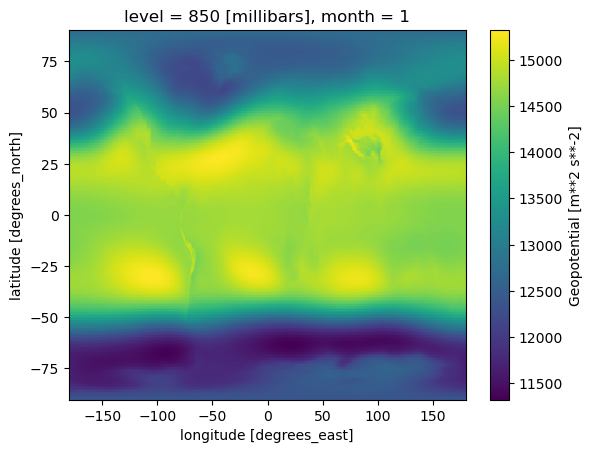

In [56]:
ds.sel(month=1, level=850).z.plot()

When sampling points using `ds.xvec.extract_points`, you are replacing these two spatial dimensions with a single one with shapely geometry.

In [57]:
points = shapely.points(
    np.repeat(np.linspace(ds.longitude.min(), ds.longitude.max(), 10), 10),
    np.tile(np.linspace(ds.latitude.min(), ds.latitude.max(), 10), 10),
)

In [58]:
points

array([<POINT (-180 -90)>, <POINT (-180 -70)>, <POINT (-180 -50)>,
       <POINT (-180 -30)>, <POINT (-180 -10)>, <POINT (-180 10)>,
       <POINT (-180 30)>, <POINT (-180 50)>, <POINT (-180 70)>,
       <POINT (-180 90)>, <POINT (-140.083 -90)>, <POINT (-140.083 -70)>,
       <POINT (-140.083 -50)>, <POINT (-140.083 -30)>,
       <POINT (-140.083 -10)>, <POINT (-140.083 10)>,
       <POINT (-140.083 30)>, <POINT (-140.083 50)>,
       <POINT (-140.083 70)>, <POINT (-140.083 90)>,
       <POINT (-100.167 -90)>, <POINT (-100.167 -70)>,
       <POINT (-100.167 -50)>, <POINT (-100.167 -30)>,
       <POINT (-100.167 -10)>, <POINT (-100.167 10)>,
       <POINT (-100.167 30)>, <POINT (-100.167 50)>,
       <POINT (-100.167 70)>, <POINT (-100.167 90)>, <POINT (-60.25 -90)>,
       <POINT (-60.25 -70)>, <POINT (-60.25 -50)>, <POINT (-60.25 -30)>,
       <POINT (-60.25 -10)>, <POINT (-60.25 10)>, <POINT (-60.25 30)>,
       <POINT (-60.25 50)>, <POINT (-60.25 70)>, <POINT (-60.25 90)>,
       <

In [59]:
extracted = ds.xvec.extract_points(
    points,
    x_coords="longitude",
    y_coords="latitude",
)

In [60]:
extracted

<xarray.Dataset>
Dimensions:   (level: 3, month: 2, geometry: 100)
Coordinates:
  * level     (level) int32 200 500 850
  * month     (month) int32 1 7
  * geometry  (geometry) object POINT (-180 -90) ... POINT (179.25 90)
Data variables:
    z         (month, level, geometry) float64 ...
    u         (month, level, geometry) float64 ...
    v         (month, level, geometry) float64 ...
Indexes:
    geometry  GeometryIndex (crs=None)
Attributes:
    Conventions:  CF-1.0
    Info:         Monthly ERA-Interim data. Downloaded and edited by fabien.m...

In [61]:
extracted.xindexes

Indexes:
    level     PandasIndex
    month     PandasIndex
    geometry  GeometryIndex (crs=None)

Pass a CRS when known.

In [62]:
extracted = ds.xvec.extract_points(
    points,
    x_coords="longitude",
    y_coords="latitude",
    crs=4326,
)

In [63]:
extracted.xindexes

Indexes:
    level     PandasIndex
    month     PandasIndex
    geometry  GeometryIndex (crs=EPSG:4326)

In [64]:
extracted.geometry.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [65]:
extracted.sel(month=1, level=850).xvec.to_geodataframe().explore(
    "z", marker_kwds=dict(radius=10)
)

CRS is inferred from objects with `.crs`.

In [66]:
gs = gpd.GeoSeries(points, crs=4326)

In [67]:
extracted = ds.xvec.extract_points(
    gs,
    x_coords="longitude",
    y_coords="latitude",
)

In [68]:
extracted.xindexes

Indexes:
    level     PandasIndex
    month     PandasIndex
    geometry  GeometryIndex (crs=EPSG:4326)

From GeoSeries, you can also retain the index.

In [69]:
extracted = ds.xvec.extract_points(
    gs,
    x_coords="longitude",
    y_coords="latitude",
    index=True,
)

In [70]:
extracted

<xarray.Dataset>
Dimensions:   (level: 3, month: 2, geometry: 100)
Coordinates:
  * level     (level) int32 200 500 850
  * month     (month) int32 1 7
  * geometry  (geometry) object POINT (-180 -90) ... POINT (179.25 90)
    index     (geometry) int64 0 1 2 3 4 5 6 7 8 ... 91 92 93 94 95 96 97 98 99
Data variables:
    z         (month, level, geometry) float64 ...
    u         (month, level, geometry) float64 ...
    v         (month, level, geometry) float64 ...
Indexes:
    geometry  GeometryIndex (crs=EPSG:4326)
Attributes:
    Conventions:  CF-1.0
    Info:         Monthly ERA-Interim data. Downloaded and edited by fabien.m...

## Reading and writing files

Vector data cubes do not have an interoperable file format.

CF conventions and NetCDF offer a way of saving a Dataset with a single dimension indexed by geometry.

### Pickle

In [71]:
demography

<xarray.Dataset>
Dimensions:       (county: 3085, year: 4)
Coordinates:
  * county        (county) object POLYGON ((-95.34258270263672 48.54670333862...
  * year          (year) int64 1960 1970 1980 1990
Data variables:
    population    (county, year) int64 4304 3987 3764 4076 ... 43766 55800 65077
    unemployment  (county, year) float64 7.9 9.0 5.903 ... 5.444 7.018 5.489
    divorce       (county, year) float64 1.859 2.62 3.747 ... 2.725 4.782 7.415
    age           (county, year) float64 28.8 30.5 34.5 ... 26.4 28.97 35.33
Indexes:
    county        GeometryIndex (crs=EPSG:4326)

In [72]:
import pickle

with open("demography.pickle", "wb") as f:
    pickle.dump(demography, f)

In [73]:
with open("demography.pickle", "rb") as f:
    cube = pickle.load(f)

In [74]:
cube

<xarray.Dataset>
Dimensions:       (county: 3085, year: 4)
Coordinates:
  * county        (county) object POLYGON ((-95.34258270263672 48.54670333862...
  * year          (year) int64 1960 1970 1980 1990
Data variables:
    population    (county, year) int64 4304 3987 3764 4076 ... 43766 55800 65077
    unemployment  (county, year) float64 7.9 9.0 5.903 ... 5.444 7.018 5.489
    divorce       (county, year) float64 1.859 2.62 3.747 ... 2.725 4.782 7.415
    age           (county, year) float64 28.8 30.5 34.5 ... 26.4 28.97 35.33
Indexes:
    county        GeometryIndex (crs=EPSG:4326)

### Joblib

In [75]:
import joblib

with open("demography.joblib.compressed", "wb") as f:
    joblib.dump(demography, f, compress=True)

In [76]:
with open("demography.joblib.compressed", "rb") as f:
    cube = joblib.load(f)

`cube.pickle`: 1.8 MB 

`cube.joblib.compressed`: 823 KB.

### GIS file formats

In [77]:
long = demography.xvec.to_geodataframe()

In [78]:
long.head()

,county,population,unemployment,divorce,age
year,,,,,
1960,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",4304,7.900000,1.858974,28.8
1970,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",3987,9.000000,2.619808,30.5
1980,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",3764,5.902579,3.746594,34.5
1990,"POLYGON ((-95.34258 48.54670, -95.34081 48.715...",4076,3.894790,7.388535,35.5
1960,"POLYGON ((-118.85050 47.94969, -118.84732 48.4...",3889,8.200000,2.863278,25.9


In [79]:
xr.Dataset.from_dataframe(long.set_index("county", append=True)).xvec.set_geom_indexes(
    "county", crs=long.crs
)

<xarray.Dataset>
Dimensions:       (year: 4, county: 3085)
Coordinates:
  * year          (year) int64 1960 1970 1980 1990
  * county        (county) object POLYGON ((-95.34258270263672 48.54670333862...
Data variables:
    population    (year, county) int64 4304 3889 17884 ... 53427 250377 65077
    unemployment  (year, county) float64 7.9 8.2 10.1 7.5 ... 4.103 3.354 5.489
    divorce       (year, county) float64 1.859 2.863 2.711 ... 4.851 5.75 7.415
    age           (year, county) float64 28.8 25.9 29.6 ... 34.0 28.47 35.33
Indexes:
    county        GeometryIndex (crs=EPSG:4326)

In [80]:
wide = demography.xvec.to_geodataframe(long=False)

In [81]:
wide.head()

county population         \
year                                                          1960   1970   
0     POLYGON ((-95.34258 48.54670, -95.34081 48.715...       4304   3987   
1     POLYGON ((-118.85050 47.94969, -118.84732 48.4...       3889   3655   
2     POLYGON ((-117.43777 48.04422, -117.54113 48.0...      17884  17405   
3     POLYGON ((-118.97096 47.93928, -118.97293 47.9...      25520  25867   
4     POLYGON ((-117.43750 49.00000, -117.03098 49.0...       6914   6025   

                   unemployment                               divorce  \
year   1980   1990         1960  1970       1980       1990      1960   
0      3764   4076          7.9   9.0   5.902579   3.894790  1.858974   
1      5811   6295          8.2  15.4  15.422886  16.811594  2.863278   
2     28979  30948         10.1   9.0  13.574064  10.700794  2.711447   
3     30639  33350          7.5  10.5  12.700195  10.203544  3.372041   
4      8580   8915         10.6  13.4  18.148999  14.991023  3.008988   

                                      age                    
year      1970      1980       1990  1960  1970  1980  1990  
0     2.619808  3.746594   7.388535  28.8  30.5  34.5  35.5  
1     3.686007  6.625442  11.543135  25.9  27.1  27.2  32.8  
2     2.976378  5.448223   9.123212  29.6  31.8  28.7  34.5  
3     4.090386  7.122333   9.245627  29.4  31.1  31.2  35.0  
4     4.010695  5.287860  10.158351  31.2  33.8  31.3  36.1

In [82]:
wide.set_index("county", append=True).stack().reset_index(
    level=0, drop=True
).to_xarray().xvec.set_geom_indexes("county", crs=wide.crs)

<xarray.Dataset>
Dimensions:       (county: 3085, year: 4)
Coordinates:
  * county        (county) object POLYGON ((-95.34258270263672 48.54670333862...
  * year          (year) object 1960 1970 1980 1990
Data variables:
    age           (county, year) float64 28.8 30.5 34.5 ... 26.4 28.97 35.33
    divorce       (county, year) float64 1.859 2.62 3.747 ... 2.725 4.782 7.415
    population    (county, year) int64 4304 3987 3764 4076 ... 43766 55800 65077
    unemployment  (county, year) float64 7.9 9.0 5.903 ... 5.444 7.018 5.489
Indexes:
    county        GeometryIndex (crs=EPSG:4326)

## Using shapely for geometric operations

In [83]:
taxi_trips

<xarray.Dataset>
Dimensions:        (payment_type: 6, date: 40, hour: 24, origin: 252,
                    destination: 257)
Coordinates:
  * payment_type   (payment_type) <U11 'Credit card' 'Cash' ... 'Voided trip'
  * date           (date) object 2008-12-31 2009-01-01 ... 2022-04-06 2022-05-18
  * hour           (hour) int64 0 1 2 3 4 5 6 7 8 ... 15 16 17 18 19 20 21 22 23
  * origin         (origin) object POLYGON ((933100.9183527103 192536.0856972...
  * destination    (destination) object POLYGON ((933100.9183527103 192536.08...
Data variables:
    trip_distance  (payment_type, date, hour, origin, destination) float64 na...
    trips_count    (payment_type, date, hour, origin, destination) float64 na...
    tip_amount     (payment_type, date, hour, origin, destination) float64 na...
    fare_amount    (payment_type, date, hour, origin, destination) float64 na...
Indexes:
    origin         GeometryIndex (crs=EPSG:2263)
    destination    GeometryIndex (crs=EPSG:2263)

Shapely ufunc operations work directly on `xarray.DataArray`s

In [84]:
shapely.centroid(taxi_trips.origin)

<xarray.DataArray 'origin' (origin: 252)>
array([<POINT (935996.821 191376.75)>, <POINT (1031085.719 164018.754)>,
       <POINT (1026452.617 254265.479)>, <POINT (990633.981 202959.782)>,
       <POINT (931871.37 140681.351)>, <POINT (964319.735 157998.936)>,
       <POINT (1006496.679 216719.218)>, <POINT (1005551.571 222936.088)>,
       <POINT (1043002.677 212969.849)>, <POINT (1042223.605 186706.496)>,
       <POINT (982170.783 159429.317)>, <POINT (979934.731 195378.973)>,
       <POINT (979792.331 198691.525)>, <POINT (975952.035 166921.55)>,
       <POINT (1043521.383 224738.613)>, <POINT (1047016.784 217243.76)>,
       <POINT (998142.206 191215.068)>, <POINT (1014623.327 255416.742)>,
       <POINT (1060002.75 207352.353)>, <POINT (1015821.861 251810.304)>,
       <POINT (988821.392 158393.658)>, <POINT (985566.418 162323.829)>,
       <POINT (936800.381 160268.124)>, <POINT (993807.272 231458.376)>,
       <POINT (988101.221 189071.579)>, <POINT (987397.463 169148.407)>,
       <POINT (1010116.053 142998.097)>, <POINT (1037276.45 198588.18)>,
       <POINT (995023.095 150924.277)>, <POINT (1033697.382 159266.087)>,
       <POINT (1018696.401 251801.913)>, <POINT (1021618.218 254085.684)>,
       <POINT (985567.139 192774.492)>, <POINT (992238.745 194618.426)>,
       <POINT (1009147.231 181203.321)>, <POINT (1007067.378 194506.265)>,
       <POINT (1005813.838 192491.073)>, <POINT (1057581.886 192354.375)>,
       <POINT (1012077.483 171746.349)>, <POINT (985371.611 186726.944)>,
...
       <POINT (1003139.566 190001.967)>, <POINT (1005124.982 208048.827)>,
       <POINT (982958.798 173132.834)>, <POINT (981122.005 176946.791)>,
       <POINT (993906.172 214975.367)>, <POINT (988628.06 216099.14)>,
       <POINT (982065.701 200780.54)>, <POINT (988955.888 199673.277)>,
       <POINT (992439.561 212491.936)>, <POINT (986894.237 209001.627)>,
       <POINT (1007494.992 249885.022)>, <POINT (996155.387 223613.754)>,
       <POINT (993769.024 219305.828)>, <POINT (991712.764 227717.518)>,
       <POINT (990167.498 224895.872)>, <POINT (1016879.869 265226.439)>,
       <POINT (1013115.882 258631.992)>, <POINT (1025564.828 247818.588)>,
       <POINT (1002830.588 251552.229)>, <POINT (1000464.311 245939.881)>,
       <POINT (955698.916 168837.059)>, <POINT (983137.466 213727.4)>,
       <POINT (1005169.123 241308.757)>, <POINT (1019590.376 243211.979)>,
       <POINT (983453.225 206902.408)>, <POINT (1026135.801 242470.435)>,
       <POINT (1035297.158 226490.627)>, <POINT (1028229.945 216434.847)>,
       <POINT (1023253.961 260702.714)>, <POINT (996053.803 201159.033)>,
       <POINT (995365.878 198271.8)>, <POINT (990359.382 177405.497)>,
       <POINT (1024249.872 190229.07)>, <POINT (1025106.231 266453.415)>,
       <POINT (1010211.977 210434.892)>, <POINT (980639.512 197635.174)>,
       <POINT (999064.725 221974.401)>, <POINT (997817.92 223005.988)>],
      dtype=object)
Coordinates:
  * origin   (origin) object POLYGON ((933100.9183527103 192536.08569720192, ...
Indexes:
    origin   GeometryIndex (crs=EPSG:2263)
Attributes:
    crs:      epsg:2263

In [85]:
shapely.area(taxi_trips.origin)

<xarray.DataArray 'origin' (origin: 252)>
array([7.90395267e+07, 1.43909532e+08, 3.16850847e+07, 8.02373302e+06,
       5.04148848e+07, 4.09347921e+07, 3.93410440e+07, 2.68280156e+06,
       3.41642180e+07, 4.40414254e+07, 2.05357438e+07, 1.08956714e+06,
       4.92291644e+06, 6.71189420e+07, 4.62957632e+07, 8.07969475e+07,
       3.26298336e+07, 1.49996577e+07, 5.51954814e+07, 1.35568566e+07,
       3.57772326e+07, 4.66687572e+07, 2.11512496e+08, 4.23011874e+06,
       1.25463591e+07, 5.40050191e+07, 7.30929144e+07, 2.94128264e+07,
       1.71810754e+07, 1.47563603e+07, 3.36597758e+07, 1.52049483e+07,
       1.10178008e+07, 1.11928128e+07, 3.27308710e+07, 2.50194472e+07,
       4.56715660e+07, 3.30765123e+07, 8.20692597e+07, 1.10096384e+07,
       1.44330917e+07, 2.54012156e+07, 3.83071761e+07, 1.45814718e+08,
       7.45033647e+06, 1.73520354e+07, 1.64515914e+07, 9.51287148e+06,
       2.05298078e+07, 8.86855509e+06, 3.98767066e+07, 4.56736446e+06,
       5.06161711e+07, 6.21345498e+06, 4.74772176e+07, 2.00839746e+07,
       1.33036735e+07, 6.33882223e+06, 1.63161299e+07, 5.16186352e+07,
       1.59934396e+07, 3.56885417e+07, 9.47857290e+07, 8.26453636e+06,
       7.66916016e+06, 3.98786992e+07, 1.12127404e+07, 2.00692737e+07,
       1.97269469e+07, 3.86801534e+07, 3.27069469e+07, 2.94543808e+07,
       2.44975278e+07, 1.66512035e+07, 1.17150572e+08, 1.93975171e+07,
       1.92651368e+07, 1.08950634e+07, 3.91660508e+07, 4.02564480e+07,
...
       3.10162276e+07, 9.18065552e+06, 9.59524799e+06, 9.86039332e+07,
       2.30342609e+07, 3.74246760e+06, 3.64212799e+07, 3.16395003e+07,
       1.02497896e+07, 2.73797291e+07, 6.95334456e+07, 3.77381522e+07,
       1.27505447e+07, 2.34664392e+07, 2.41688289e+07, 1.99411278e+07,
       5.09886710e+07, 5.04867344e+07, 4.90273971e+07, 3.76532435e+07,
       6.31680840e+06, 6.15216850e+07, 7.74145810e+07, 5.60694217e+07,
       4.51371075e+06, 8.85670600e+07, 2.79893786e+06, 4.29253044e+07,
       4.01208274e+06, 1.62614373e+07, 5.96022610e+07, 6.70359071e+07,
       3.99722306e+07, 8.24706285e+07, 1.15898663e+07, 2.84285524e+07,
       4.32794180e+07, 2.32236444e+07, 4.65306337e+07, 1.15978522e+07,
       5.77786868e+07, 5.56938956e+06, 3.14066204e+07, 7.48536944e+07,
       2.71292346e+07, 5.00692912e+07, 6.41764251e+06, 5.66141425e+06,
       1.19467363e+07, 1.52265185e+07, 6.14257532e+06, 7.38080091e+06,
       2.12509139e+07, 1.03791056e+07, 9.68690978e+06, 1.22794844e+07,
       1.31309555e+07, 7.27401850e+07, 2.56604716e+07, 3.62958316e+07,
       2.26635877e+07, 2.30999339e+07, 4.71428235e+07, 1.28507735e+07,
       1.93677480e+07, 1.50820023e+07, 7.29159481e+06, 2.39508737e+07,
       6.90468979e+07, 6.40567652e+06, 3.62735152e+07, 1.47471383e+07,
       1.41543499e+07, 1.40425479e+07, 3.70013177e+07, 3.97412496e+07,
       4.26379716e+07, 3.46884748e+06, 6.95782575e+06, 6.63639399e+06])
Coordinates:
  * origin   (origin) object POLYGON ((933100.9183527103 192536.08569720192, ...
Indexes:
    origin   GeometryIndex (crs=EPSG:2263)
Attributes:
    crs:      epsg:2263

In [86]:
shapely.is_valid(taxi_trips.origin)

<xarray.DataArray 'origin' (origin: 252)>
array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])
Coordinates:
  * origin   (origin) object POLYGON ((933100.9183527103 192536.08569720192, ...
Indexes:
    origin   GeometryIndex (crs=EPSG:2263)
Attributes:
    crs:      epsg:2263

In [87]:
shapely.unary_union(taxi_trips.origin)

```sh
pip install xvec
```

Requires:
```sh
xarray >= 2022.12.0,
pyproj >= 3.0.0,
shapely >= 2.0b1,
```

# xvec.readthedocs.io

# github.com/xarray-contrib/xvec

# @martinfleis